## Required Packages

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

from scipy.stats import gaussian_kde
from scipy.stats import zscore

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pd.set_option('display.max_columns', 100)

## Import data

In [ ]:
df = pd.read_csv('/content/drive/Shareddrives/df675Project/creditcard_2023.csv')

### General Information

In [ ]:
df.head()

,id,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0,-0.260648,-0.469648,2.496266,-0.083724,0.129681,0.732898,0.519014,-0.130006,0.727159,0.637735,-0.987020,0.293438,-0.941386,0.549020,1.804879,0.215598,0.512307,0.333644,0.124270,0.091202,-0.110552,0.217606,-0.134794,0.165959,0.126280,-0.434824,-0.081230,-0.151045,17982.10,0
1,1,0.985100,-0.356045,0.558056,-0.429654,0.277140,0.428605,0.406466,-0.133118,0.347452,0.529808,0.140107,1.564246,0.574074,0.627719,0.706121,0.789188,0.403810,0.201799,-0.340687,-0.233984,-0.194936,-0.605761,0.079469,-0.577395,0.190090,0.296503,-0.248052,-0.064512,6531.37,0
2,2,-0.260272,-0.949385,1.728538,-0.457986,0.074062,1.419481,0.743511,-0.095576,-0.261297,0.690708,-0.272985,0.659201,0.805173,0.616874,3.069025,-0.577514,0.886526,0.239442,-2.366079,0.361652,-0.005020,0.702906,0.945045,-1.154666,-0.605564,-0.312895,-0.300258,-0.244718,2513.54,0
3,3,-0.152152,-0.508959,1.746840,-1.090178,0.249486,1.143312,0.518269,-0.065130,-0.205698,0.575231,-0.752581,0.737483,0.592994,0.559535,-0.697664,-0.030669,0.242629,2.178616,-1.345060,-0.378223,-0.146927,-0.038212,-0.214048,-1.893131,1.003963,-0.515950,-0.165316,0.048424,5384.44,0
4,4,-0.206820,-0.165280,1.527053,-0.448293,0.106125,0.530549,0.658849,-0.212660,1.049921,0.968046,-1.203171,1.029577,1.439310,0.241454,0.153008,0.224538,0.366466,0.291782,0.445317,0.247237,-0.106984,0.729727,-0.161666,0.312561,-0.414116,1.071126,0.023712,0.419117,14278.97,0


In [ ]:
df.tail()

,id,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
568625,568625,-0.833437,0.061886,-0.899794,0.904227,-1.002401,0.481454,-0.370393,0.189694,-0.938153,-1.161847,1.430971,-1.330500,-1.580730,-1.363454,0.287766,-1.480796,-1.520928,-1.376970,1.789103,-0.751011,0.167503,0.419731,1.288249,-0.900861,0.560661,-0.006018,3.308968,0.081564,4394.16,1
568626,568626,-0.670459,-0.202896,-0.068129,-0.267328,-0.133660,0.237148,-0.016935,-0.147733,0.483894,-0.210817,0.173590,-0.539948,0.738315,-0.812043,0.870447,-0.545184,-0.575991,-0.664313,0.101604,-0.550260,0.031874,0.388161,-0.154257,-0.846452,-0.153443,1.961398,-1.528642,1.704306,4653.40,1
568627,568627,-0.311997,-0.004095,0.137526,-0.035893,-0.042291,0.121098,-0.070958,-0.019997,-0.122048,-0.144495,0.477582,-0.461849,-0.606100,-0.395126,-0.040673,-0.370201,-0.729002,-0.251679,-0.343196,-0.076417,0.140788,0.536523,-0.211100,-0.448909,0.540073,-0.755836,-0.487540,-0.268741,23572.85,1
568628,568628,0.636871,-0.516970,-0.300889,-0.144480,0.131042,-0.294148,0.580568,-0.207723,0.893527,-0.080078,-0.324934,0.335215,0.464177,-0.390369,0.893881,0.477402,0.848443,0.930280,-0.481058,0.288186,-0.060381,-0.195609,-0.175488,-0.554643,-0.099669,-1.434931,-0.159269,-0.076251,10160.83,1
568629,568629,-0.795144,0.433236,-0.649140,0.374732,-0.244976,-0.603493,-0.347613,-0.340814,0.253971,-0.513556,0.892136,-1.153011,0.489197,-1.062488,0.207773,-0.917240,-0.936114,-0.823688,-0.330408,-0.621378,0.534853,-0.291514,0.157303,0.931030,-0.349423,-1.090974,-1.575113,0.722936,21493.92,1


In [ ]:
df.shape

(568630, 31)

#### Dimensions : (568630,31)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568630 entries, 0 to 568629
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   id      568630 non-null  int64  
 1   V1      568630 non-null  float64
 2   V2      568630 non-null  float64
 3   V3      568630 non-null  float64
 4   V4      568630 non-null  float64
 5   V5      568630 non-null  float64
 6   V6      568630 non-null  float64
 7   V7      568630 non-null  float64
 8   V8      568630 non-null  float64
 9   V9      568630 non-null  float64
 10  V10     568630 non-null  float64
 11  V11     568630 non-null  float64
 12  V12     568630 non-null  float64
 13  V13     568630 non-null  float64
 14  V14     568630 non-null  float64
 15  V15     568630 non-null  float64
 16  V16     568630 non-null  float64
 17  V17     568630 non-null  float64
 18  V18     568630 non-null  float64
 19  V19     568630 non-null  float64
 20  V20     568630 non-null  float64
 21  V21     56

In [ ]:
df.describe()

,id,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,568630.000000,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,5.686300e+05,568630.000000,568630.0
mean,284314.500000,-5.638058e-17,-1.319545e-16,-3.518788e-17,-2.879008e-17,7.997245e-18,-3.958636e-17,-3.198898e-17,2.109273e-17,3.998623e-17,1.991314e-16,-1.183592e-16,-5.758017e-17,-5.698037e-18,-4.078595e-17,2.649087e-17,-1.719408e-17,-3.398829e-17,-5.837989e-17,2.479146e-17,-1.579456e-17,4.758361e-17,3.948640e-18,6.194741e-18,-2.799036e-18,-3.178905e-17,-7.497417e-18,-3.598760e-17,2.609101e-17,12041.957635,0.5
std,164149.486122,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,6919.644449,0.5
min,0.000000,-3.495584e+00,-4.996657e+01,-3.183760e+00,-4.951222e+00,-9.952786e+00,-2.111111e+01,-4.351839e+00,-1.075634e+01,-3.751919e+00,-3.163276e+00,-5.954723e+00,-2.020399e+00,-5.955227e+00,-2.107417e+00,-3.861813e+00,-2.214513e+00,-2.484938e+00,-2.421949e+00,-7.804988e+00,-7.814784e+01,-1.938252e+01,-7.734798e+00,-3.029545e+01,-4.067968e+00,-1.361263e+01,-8.226969e+00,-1.049863e+01,-3.903524e+01,50.010000,0.0
25%,142157.250000,-5.652859e-01,-4.866777e-01,-6.492987e-01,-6.560203e-01,-2.934955e-01,-4.458712e-01,-2.835329e-01,-1.922572e-01,-5.687446e-01,-5.901008e-01,-7.014495e-01,-8.311331e-01,-6.966667e-01,-8.732057e-01,-6.212485e-01,-7.162655e-01,-6.194913e-01,-5.560458e-01,-5.653082e-01,-3.502399e-01,-1.664408e-01,-4.904892e-01,-2.376289e-01,-6.515801e-01,-5.541485e-01,-6.318948e-01,-3.049607e-01,-2.318783e-01,6054.892500,0.0
50%,284314.500000,-9.363846e-02,-1.358939e-01,3.528579e-04,-7.376152e-02,8.108788e-02,7.871758e-02,2.333659e-01,-1.145242e-01,9.252647e-02,2.626145e-01,-4.104986e-02,1.620521e-01,1.760812e-02,2.305011e-01,-3.925566e-02,1.340262e-01,2.716407e-01,8.729382e-02,-2.597869e-02,-1.233776e-01,-3.743065e-02,-2.732881e-02,-5.968903e-02,1.590123e-02,-8.193162e-03,-1.189208e-02,-1.729111e-01,-1.392973e-02,12030.150000,0.5
75%,426471.750000,8.326582e-01,3.435552e-01,6.285380e-01,7.070047e-01,4.397368e-01,4.977881e-01,5.259548e-01,4.729905e-02,5.592621e-01,5.924603e-01,7.477730e-01,7.446723e-01,6.856048e-01,7.518216e-01,6.654065e-01,6.556061e-01,5.182242e-01,5.443887e-01,5.601164e-01,2.482164e-01,1.479787e-01,4.638817e-01,1.557153e-01,7.007374e-01,5.500147e-01,6.728879e-01,3.340230e-01,4.095903e-01,18036.330000,1.0
max,568629.000000,2.229046e+00,4.361865e+00,1.412583e+01,3.201536e+00,4.271689e+01,2.616840e+01,2.178730e+02,5.958040e+00,2.027006e+01,3.172271e+01,2.513573e+00,1.791356e+01,7.187486e+00,1.916954e+01,1.453220e+01,4.665291e+01,6.994124e+00,6.783716e+00,3.831672e+00,2.987281e+01,8.087080e+00,1.263251e+01,3.170763e+01,1.296564e+01,1.462151e+01,5.623285e+00,1.132311e+02,7.725594e+01,24039.930000,1.0


#### Other Comments
* We only have two datatypes, float and integer, here.
* There are no missing values.
* Values for V1 to V28 and Cost are on a different scale.
* We need to represent the values of 'id' in a different way. Currently, these values imply an ordinal nature, which is not the situation. We could reorder them according to increasing order of cost associated with each transaction.

## Data Preprocessing and Visualizaiton

In [ ]:
df = df.drop_duplicates()
df.shape

(568630, 31)

### There are no duplicate entries.

### Visualizing each feature's distribution

In [ ]:
to_be_ignored = ['id']

### ID vs Class

In [ ]:
fig = go.Figure()

fig = px.histogram(df, x='Class', color='Class', template='plotly_dark', barmode='group' )

fig.update_traces(marker_color='blue', marker_line_color='black', marker_line_width=1.5, opacity=0.6)

fig.update_xaxes(ticktext=["Legitimate", "Fraudulent"], tickvals=[-0.2, 1.2])

fig.update_layout(title_text='Distribution of Transactions', xaxis_title='Classes', yaxis_title='Count', title_x=0.5)

fig.show()

#### V1 to V28

In [ ]:
#features = df.columns
#an_features = [feature for feature in features if feature not in to_be_ignored + ['Class','Amount']]
#an_features
#for feature in features:
#  if feature not in categorical + to_be_ignored:
#    fig = go.Figure()
#    fig = px.histogram(df, x=feature, marginal='violin',
#                   template='plotly_dark', barmode='overlay')
#    fig.update_traces(opacity=0.6)
#    fig.update_layout(title_text=f'Distribution of {feature}', xaxis_title='Values', yaxis_title='Count', title_x=0.5)
#    fig.show()


In [ ]:
def plot_violin_and_histogram(df, feature_name, figsize=(8, 8), title='Distribution of '):
    fig, axs = plt.subplots(nrows=2, ncols=1, figsize=figsize, sharex=True)
    sns.violinplot(data=df, x=feature_name, ax=axs[0], inner='quartile')
    axs[0].set_xlabel('')
    sns.histplot(data=df, x=feature_name, kde=True, ax=axs[1])
    plt.tight_layout()
    title = title + feature_name
    fig.suptitle(title)
    plt.show()

 Output size limit reached with pyplot.

In [ ]:
dealingWithOutliers = {
    'useIQR':[],
#    'useZS':[],
}

##### V1 to V7

In [ ]:
anonList1 = ['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7']

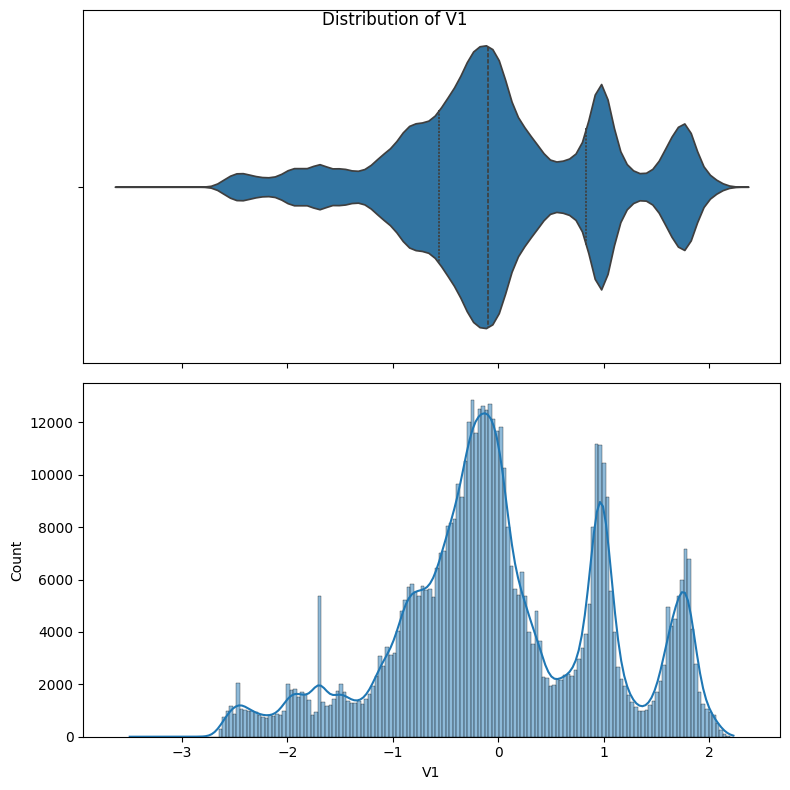

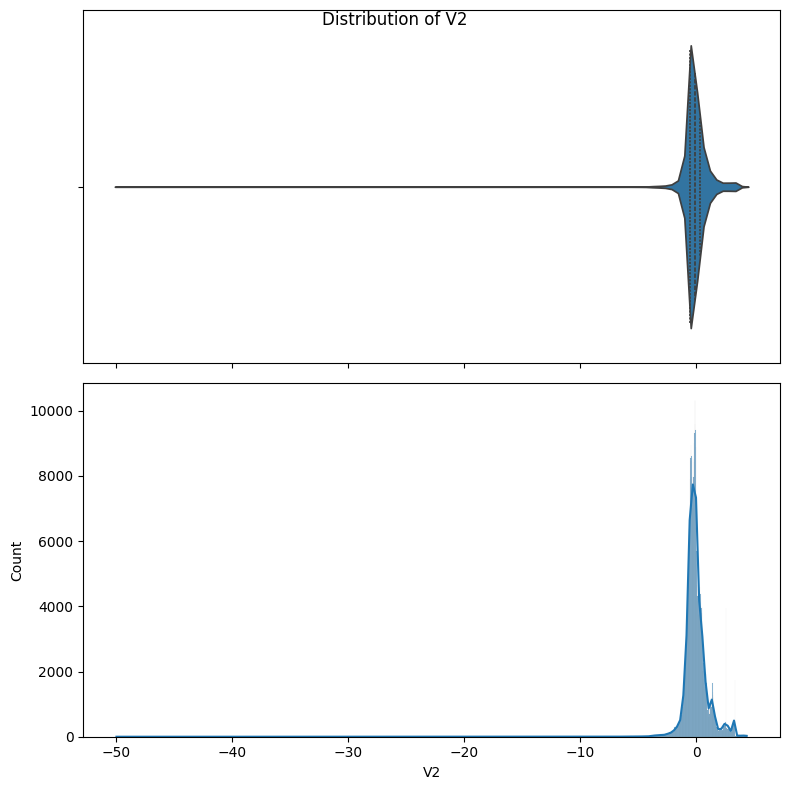

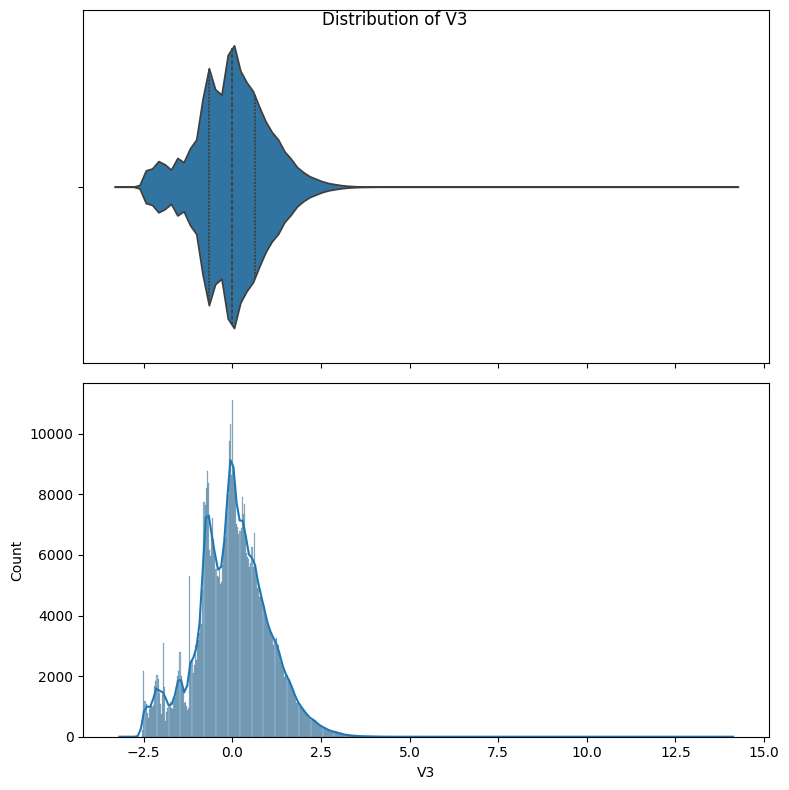

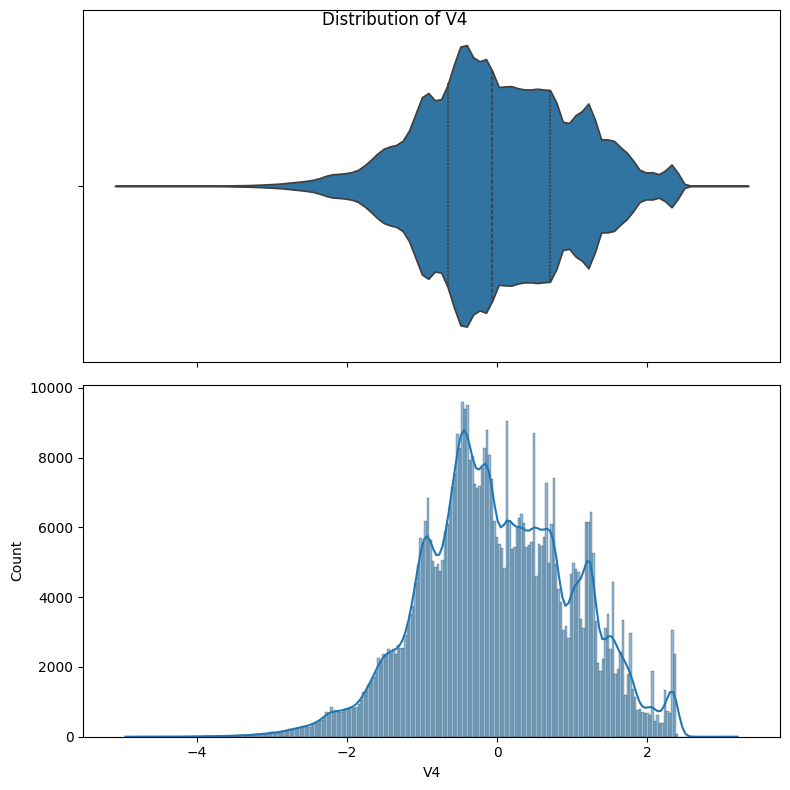

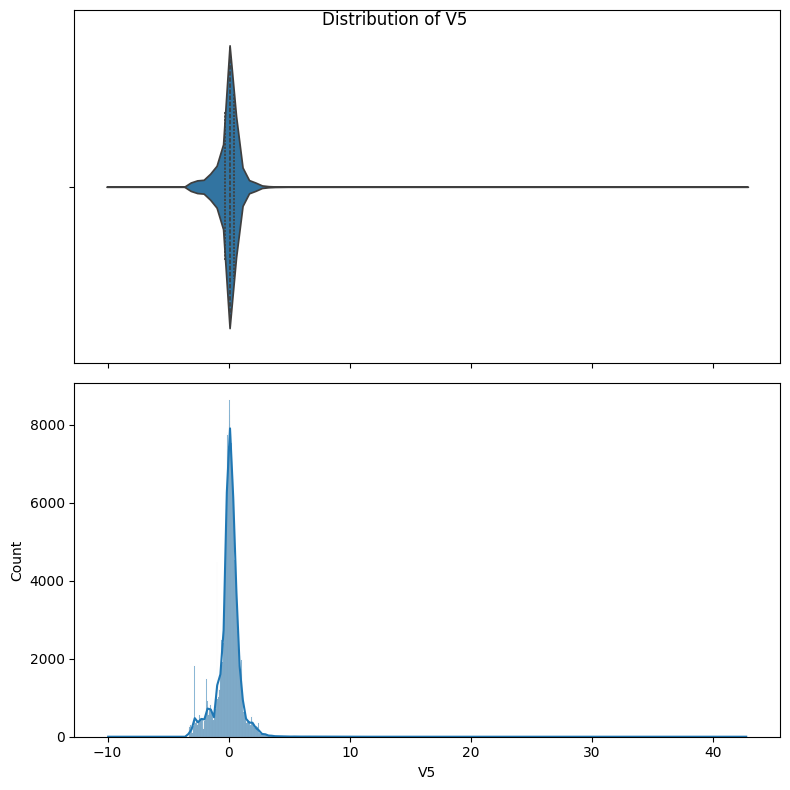

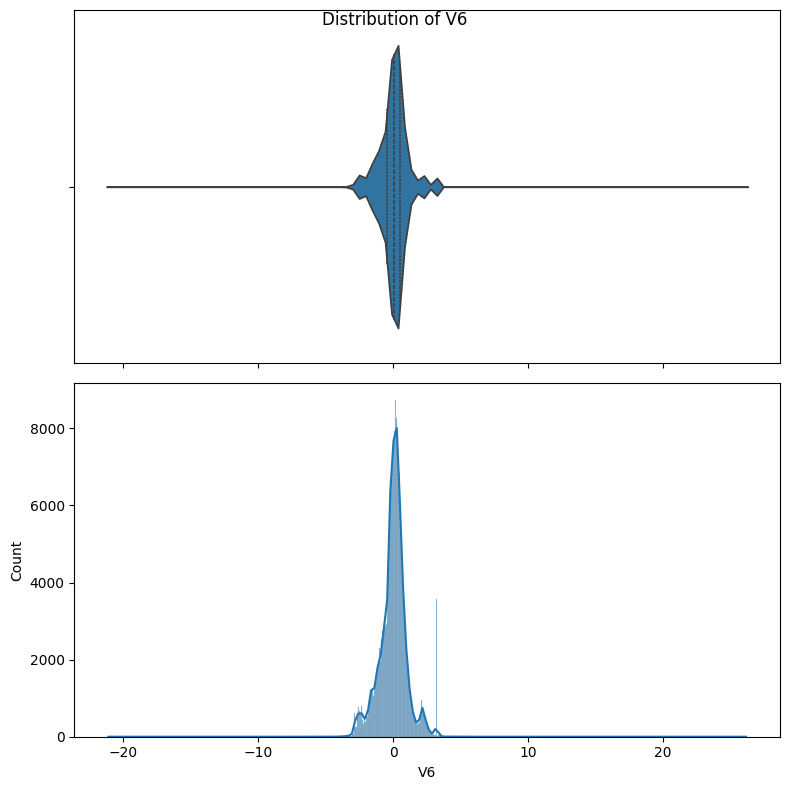

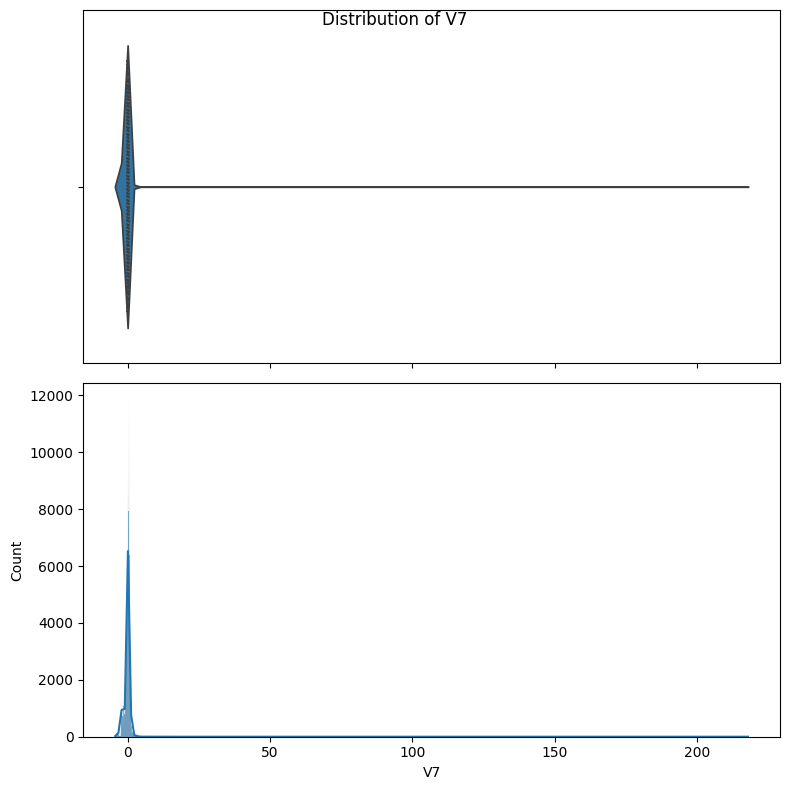

In [ ]:
for anonFeature in anonList1:
  plot_violin_and_histogram(df,anonFeature)

##### V8 to V14

In [ ]:
anonList2 = ['V8','V9', 'V10', 'V11', 'V12', 'V13', 'V14']

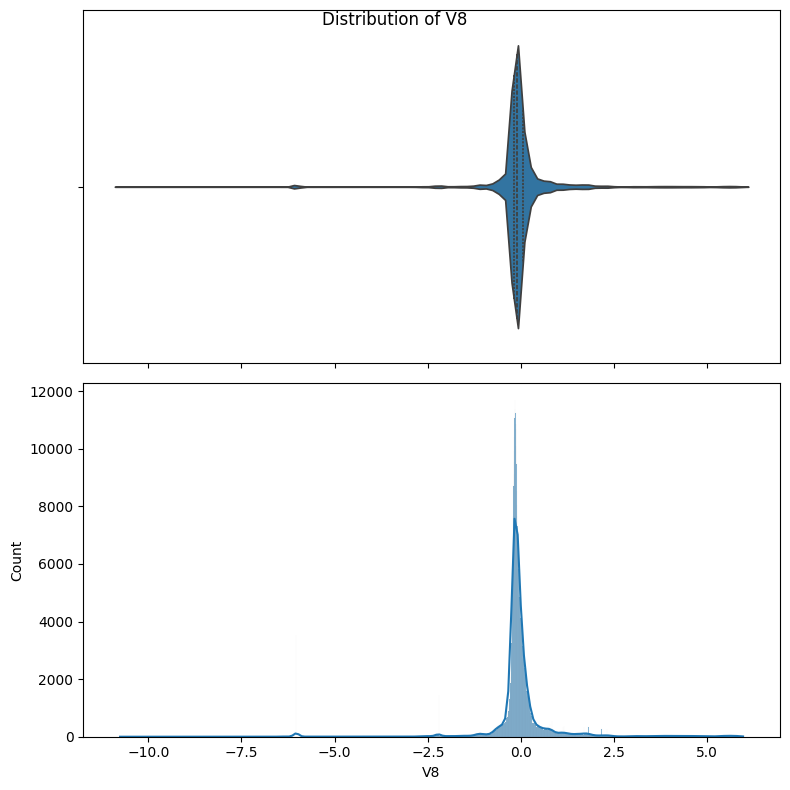

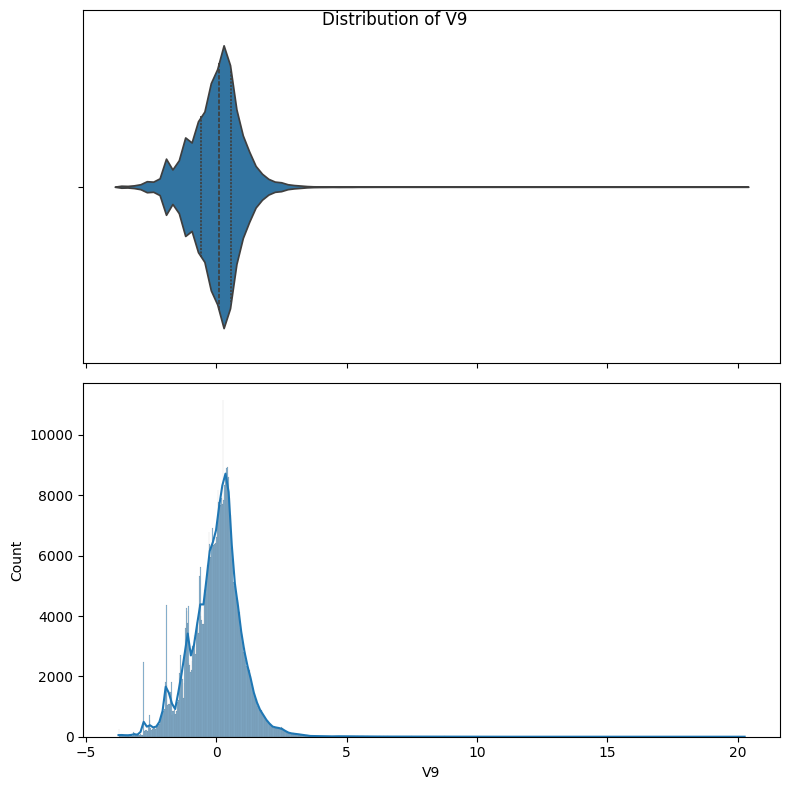

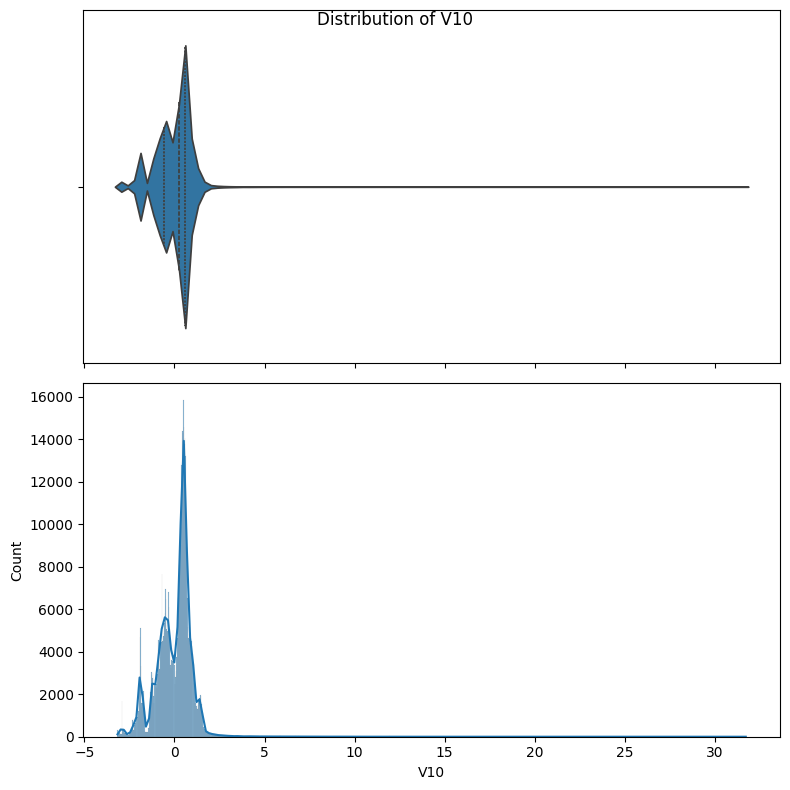

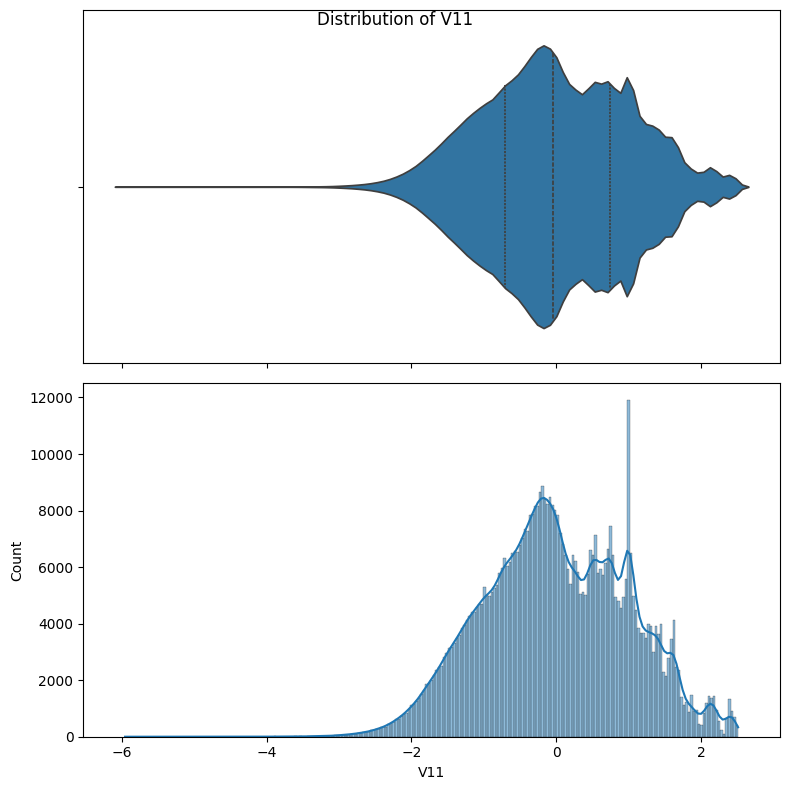

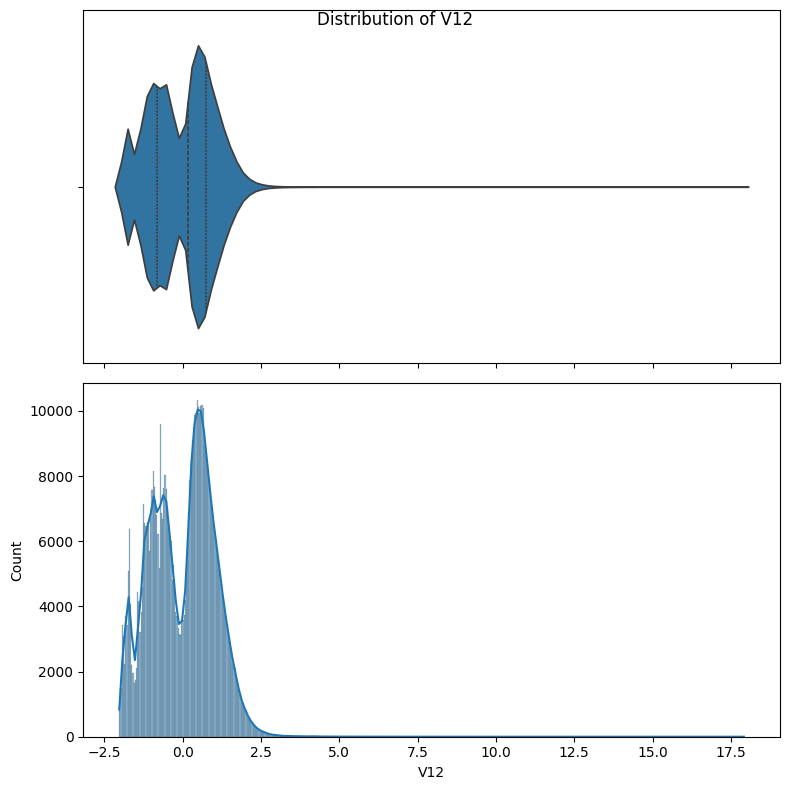

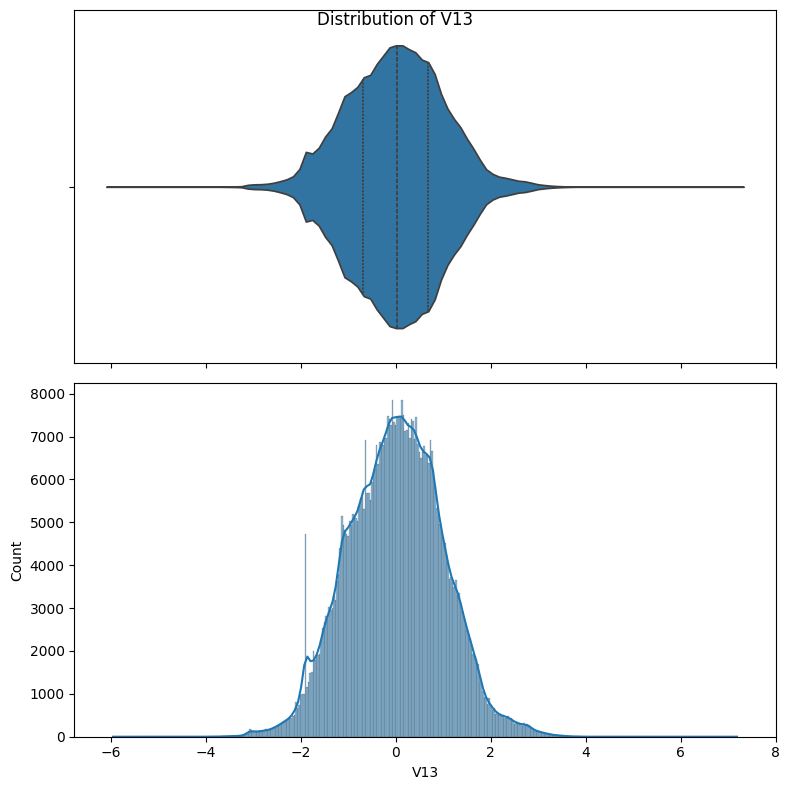

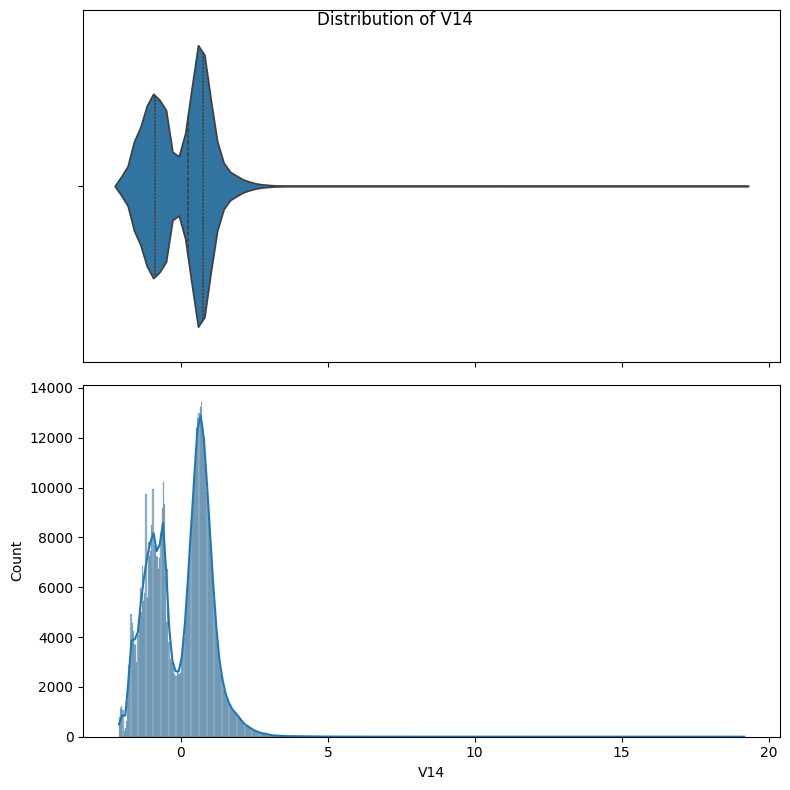

In [ ]:
for anonFeature in anonList2:
  plot_violin_and_histogram(df,anonFeature)

##### V15 to V21

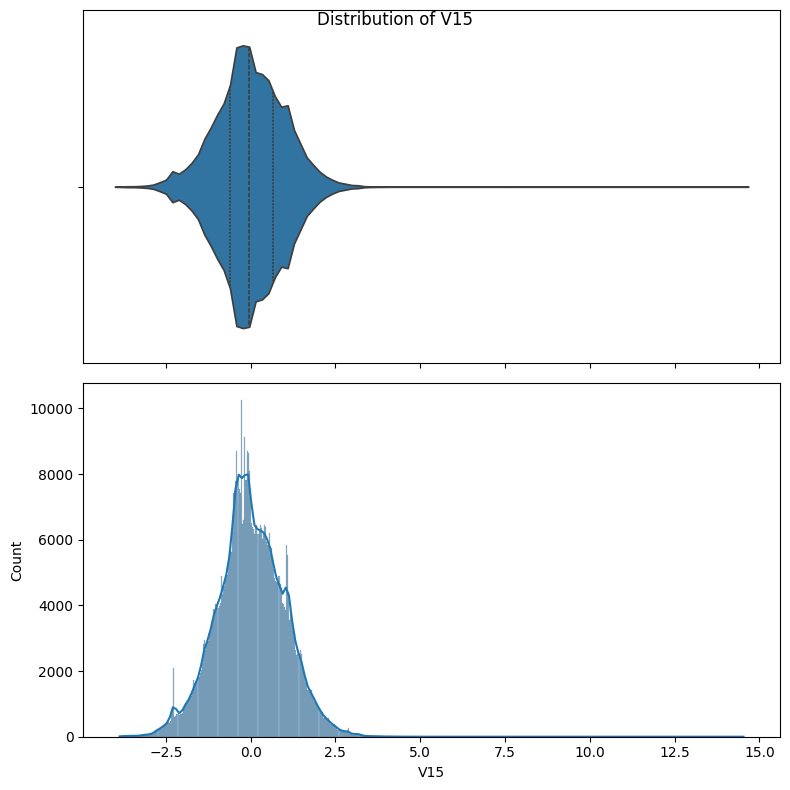

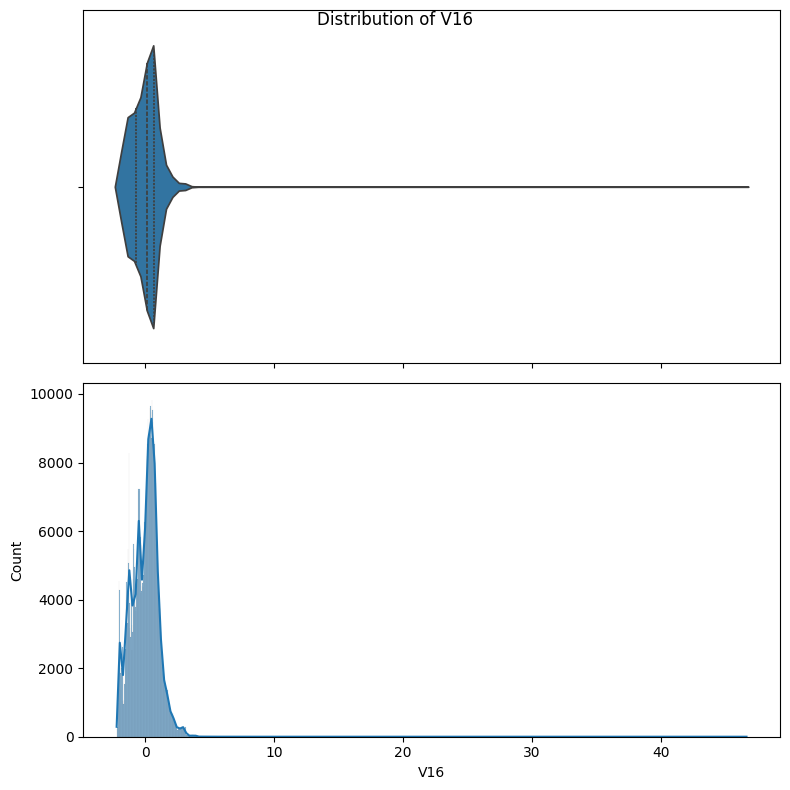

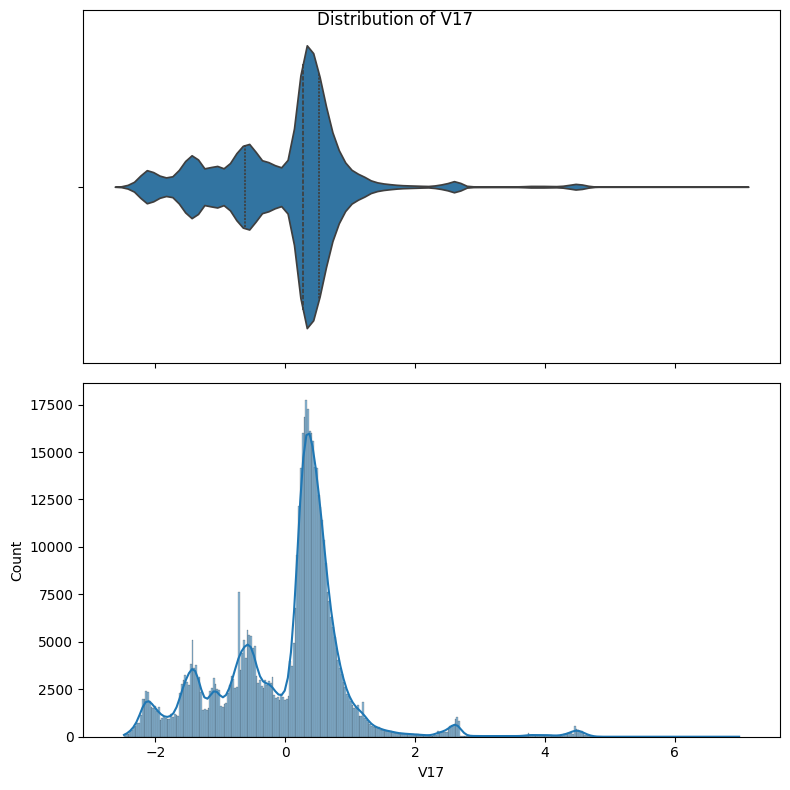

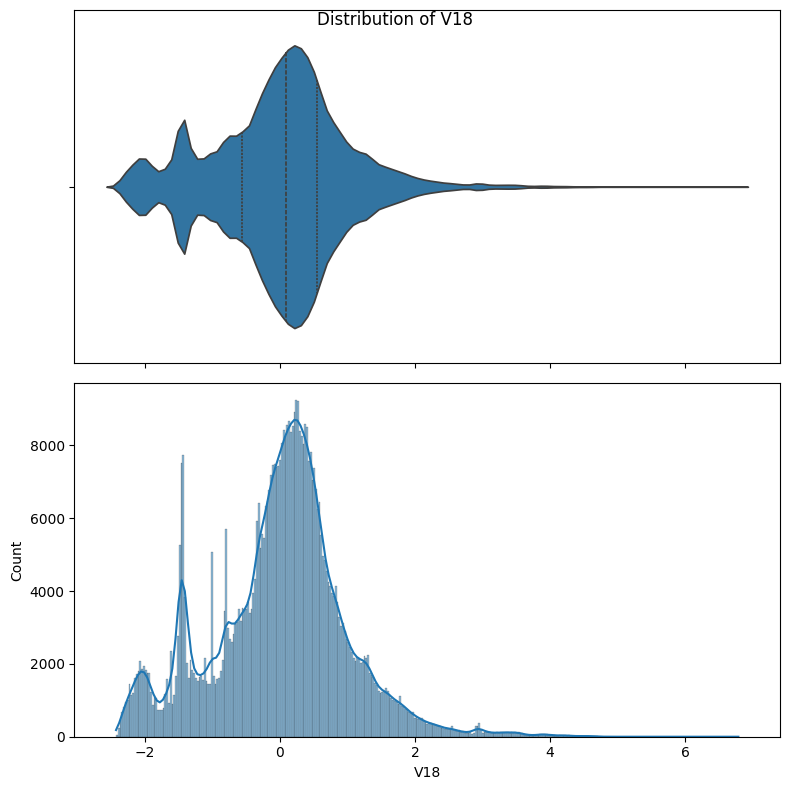

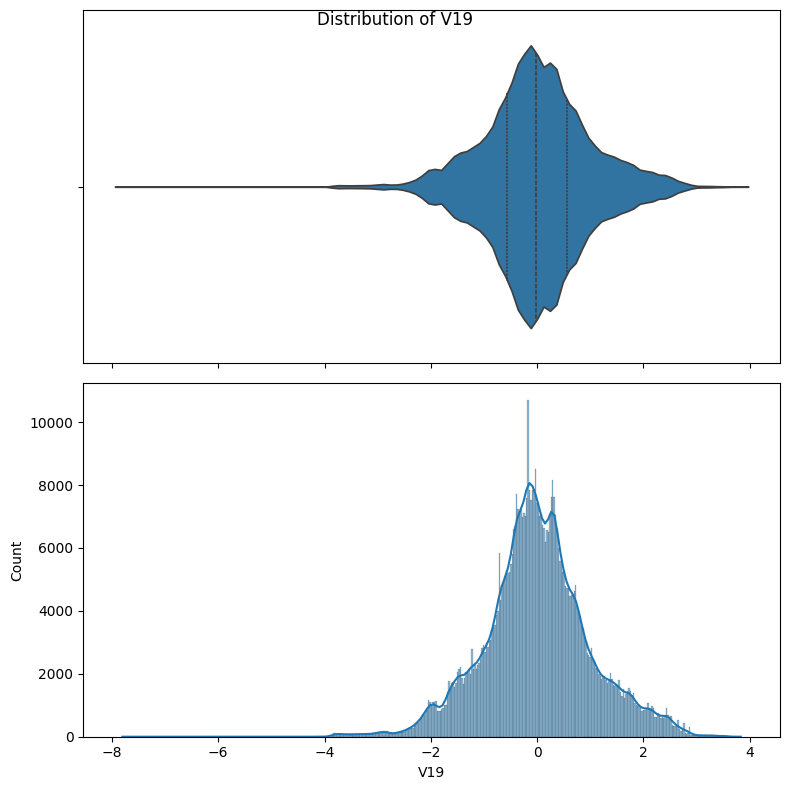

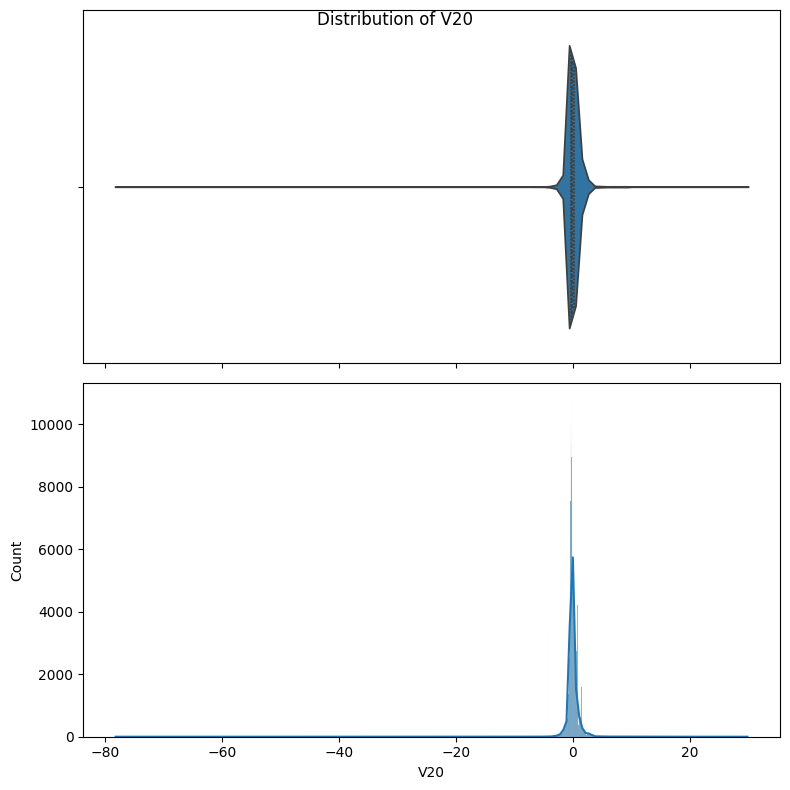

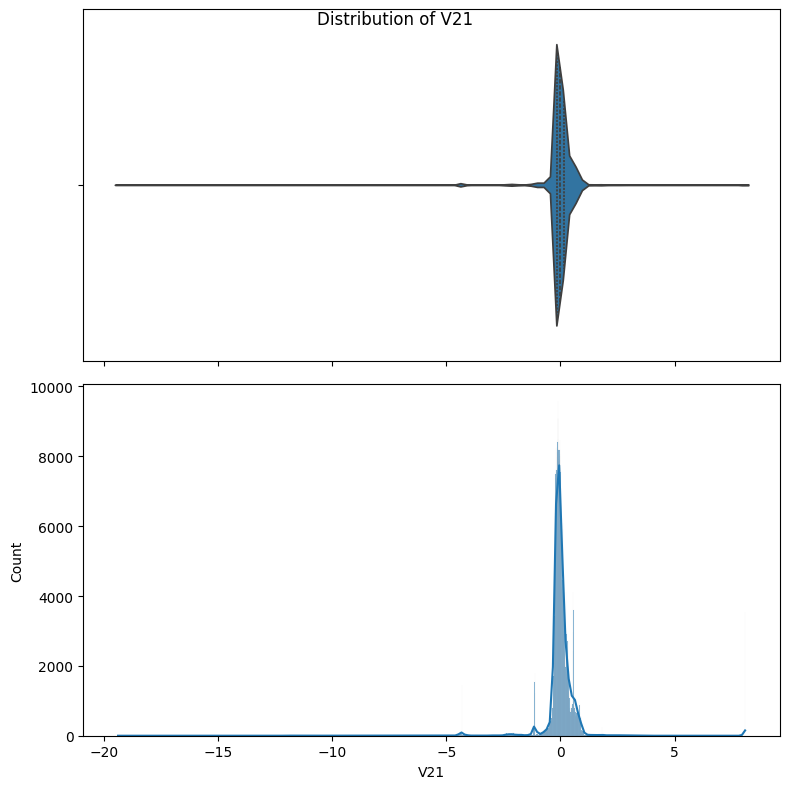

In [ ]:
anonList3 = ['V15','V16','V17','V18','V19','V20','V21']
for anonFeature in anonList3:
  plot_violin_and_histogram(df,anonFeature)

##### V22 to V28

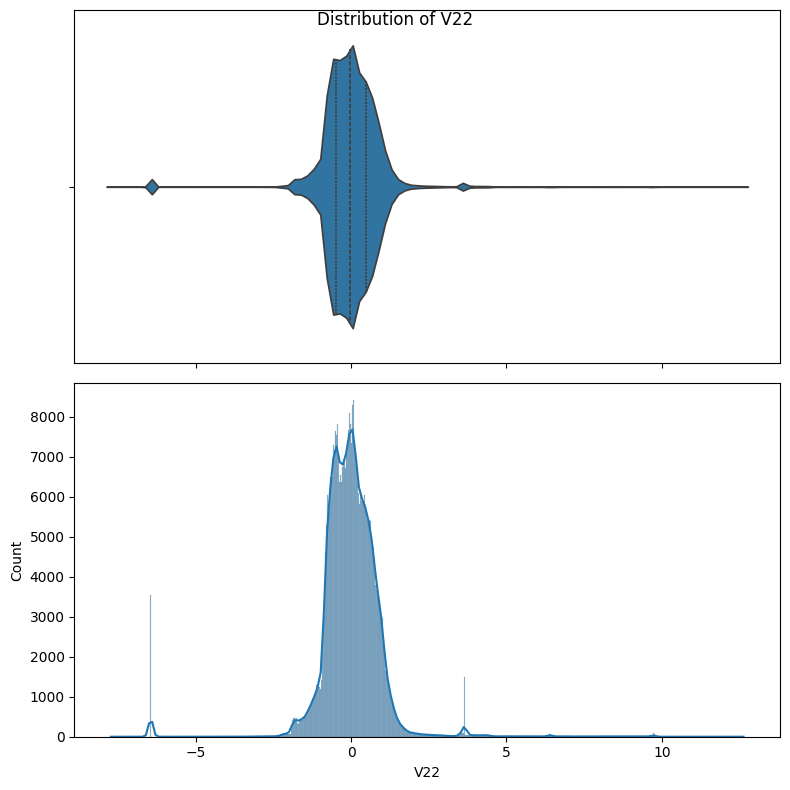

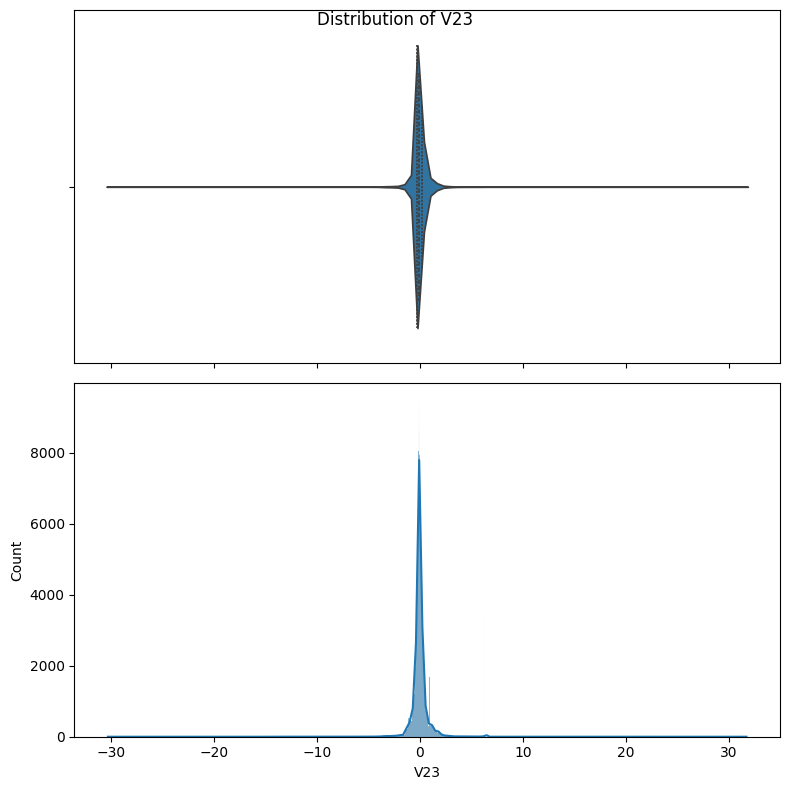

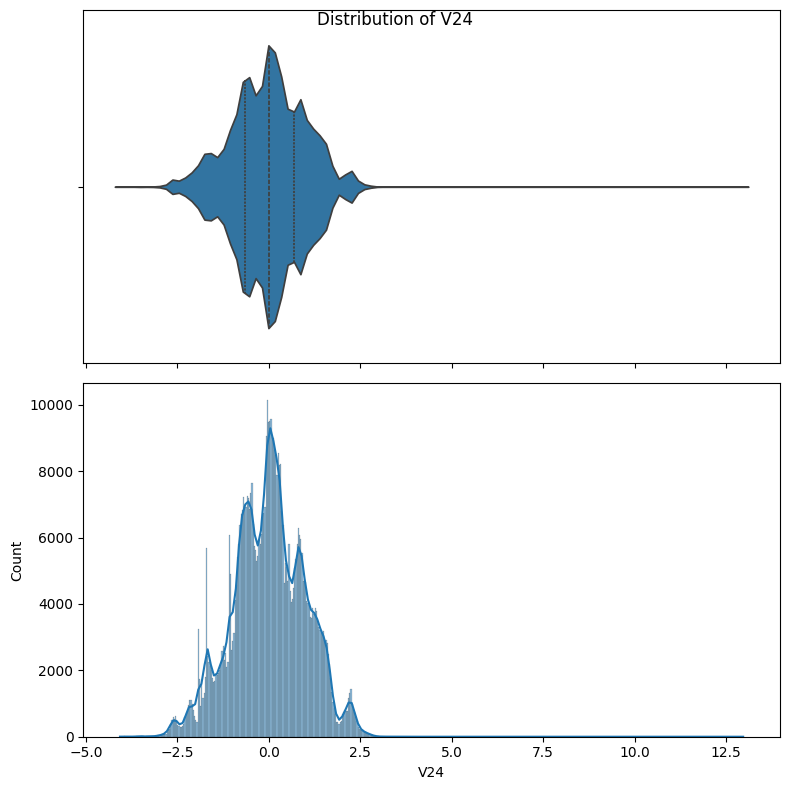

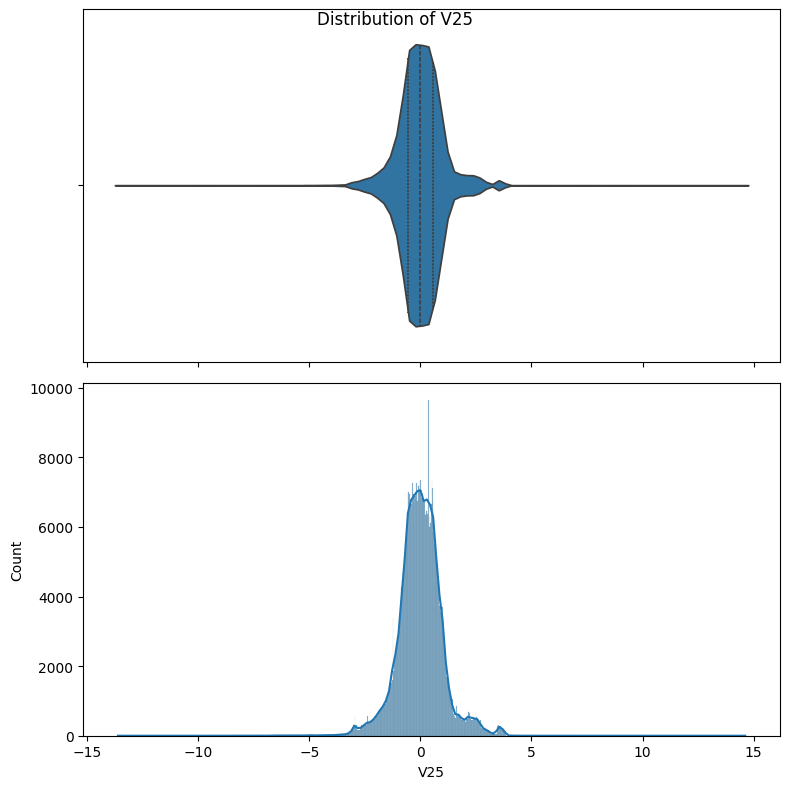

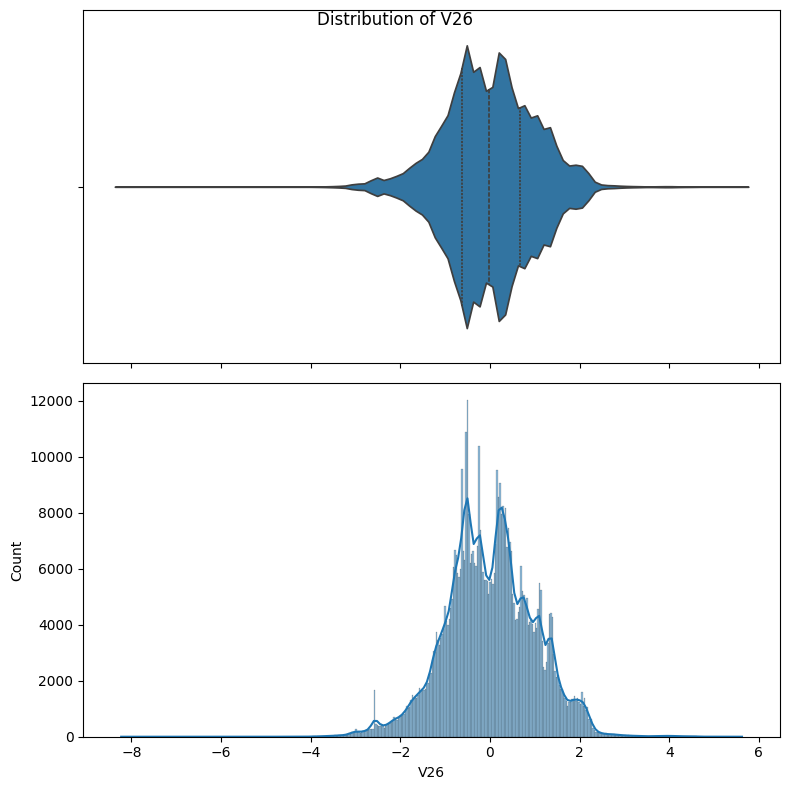

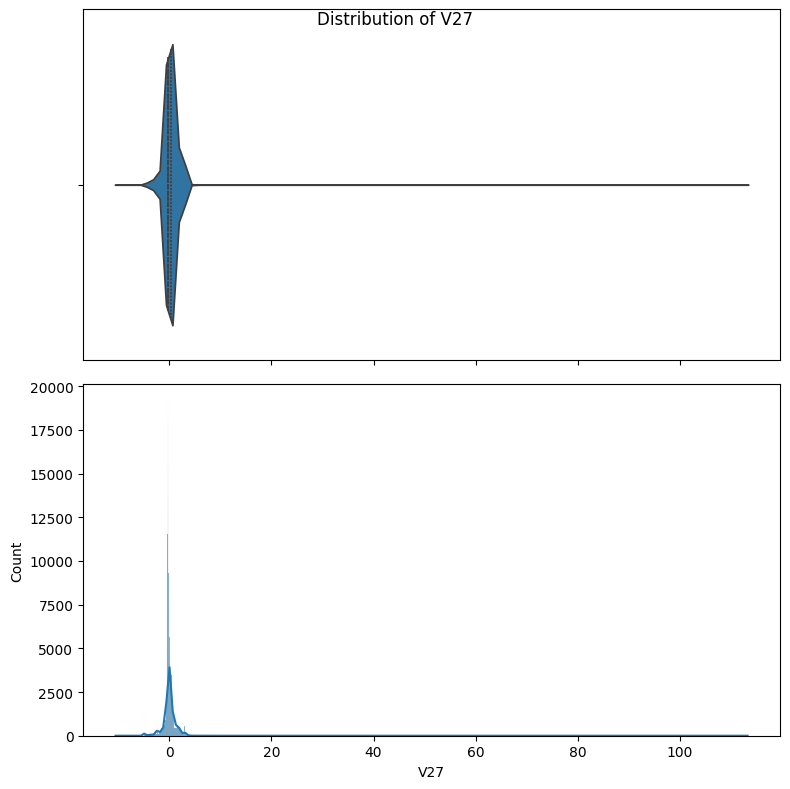

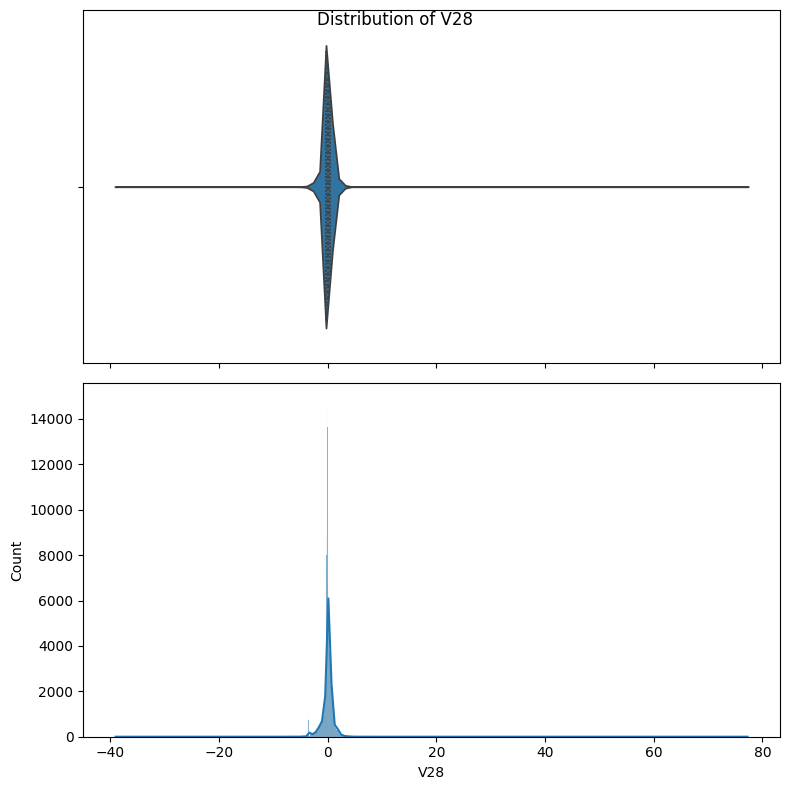

In [ ]:
anonList4 = ['V22','V23', 'V24', 'V25', 'V26', 'V27', 'V28']
for anonFeature in anonList4:
  plot_violin_and_histogram(df,anonFeature)

#### Amount

In [ ]:
fig = go.Figure()
fig = px.histogram(df, x='Amount', marginal='violin',
                template='plotly_dark', barmode='overlay')
fig.update_traces(opacity=0.6)
fig.update_layout(title_text=f'Distribution of Cost', xaxis_title='Values', yaxis_title='Count', title_x=0.5)
fig.show()

### ID vs Amount with Class

[]

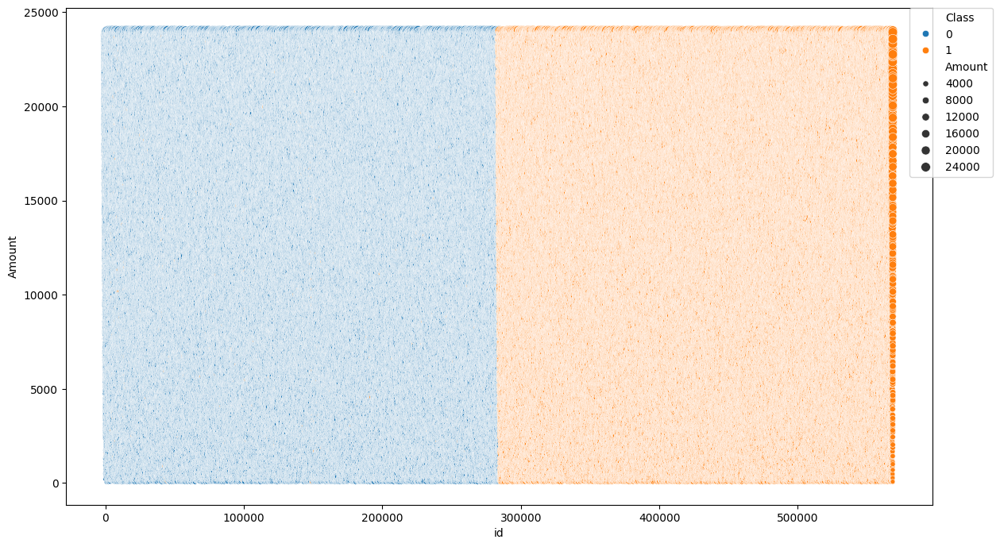

In [ ]:
plt.figure(figsize=(15,7))
sns.scatterplot(data=df, x="id",  y="Amount", hue="Class", size='Amount')
plt.legend(loc='upper right', bbox_to_anchor=(1.07, 1), borderaxespad=0.)
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.plot()

### Amount vs Class

[]

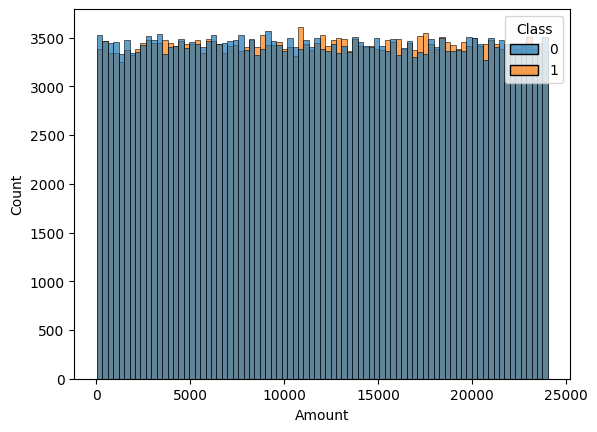

In [ ]:
sns.histplot(data=df, x='Amount', hue='Class',alpha=0.7, legend=True)
plt.plot()

### We can drop ids, just need to reshuffle the data

In [ ]:
df.drop(columns=['id'],inplace=True)

### Removing outliers

In [ ]:
def remove_outliers_iqr(df, column):
    Q1, Q3 = df[column].quantile([0.25, 0.75])
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    df = df.loc[(df[column] >= lower) & (df[column] <= upper)]
    return df


In [ ]:
to_be_ignored = ['Class']
indFeatures = [feature for feature in df.columns if feature not in to_be_ignored]

dfWithoutOutliers = df.copy()

for indFeature in indFeatures:
  dfWithoutOutliers = remove_outliers_iqr(dfWithoutOutliers,indFeature)

#### Shape without outliers

In [ ]:
dfWithoutOutliers.shape

(245934, 30)

### Correlation Matrix

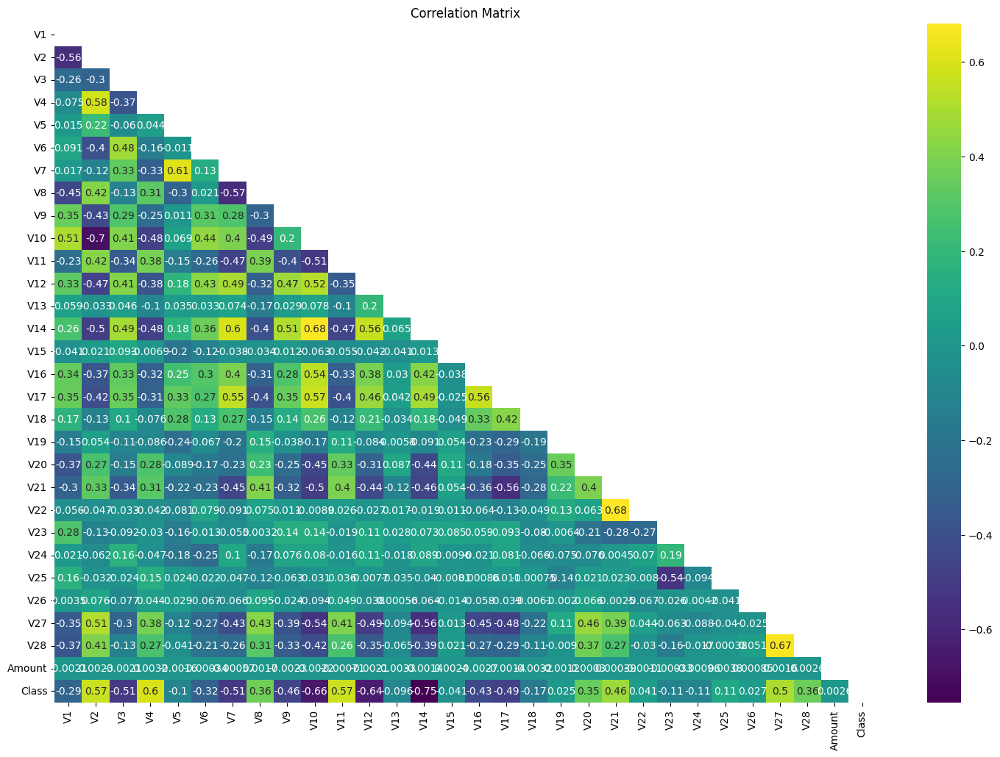

In [ ]:
plt.figure(figsize=(18, 12))
corrMatrix = dfWithoutOutliers.corr(numeric_only=True)
mask = np.triu(np.ones_like(corrMatrix, dtype=bool))
sns.heatmap(corrMatrix, mask=mask, cmap='viridis', annot=True)
plt.title(f'Correlation Matrix')
plt.show()

##### Thresholds to be experimented.
* 0.6
* 0.7
* 0.8


In [ ]:
dfExp = dfWithoutOutliers
classIndex = corrMatrix.columns.get_loc('Class')
mask[:, classIndex] = False
mask[classIndex, :] = False

In [ ]:
def handleMultiCollinearity(df, threshold):

    highCorr = []
    columnsToDrop = set()

    for i in range(len(corrMatrix.columns)):
        for j in range(i + 1, len(corrMatrix.columns)):
            if mask[i, j] and abs(corrMatrix.iloc[i, j]) > threshold:
                corr_with_class_i = abs(corrMatrix.iloc[i, classIndex])
                corr_with_class_j = abs(corrMatrix.iloc[j, classIndex])
                if corr_with_class_i > corr_with_class_j:
                    columnsToDrop.add(corrMatrix.columns[j])
                else:
                    columnsToDrop.add(corrMatrix.columns[i])

    print(f"Columns to drop for threshold = {threshold}:")
    for column in columnsToDrop:
        print(column)

    return columnsToDrop


In [ ]:
dropColumns = handleMultiCollinearity(dfExp,0.6)
dataForThres06 = dfExp.drop(dropColumns,axis=1)

dropColumns = handleMultiCollinearity(dfExp,0.7)
dataForThres07 = dfExp.drop(dropColumns,axis=1)

dropColumns = handleMultiCollinearity(dfExp,0.8)
dataForThres08 = dfExp.drop(dropColumns,axis=1)

Columns to drop for threshold = 0.6:
V28
V5
V2
V22
V10
Columns to drop for threshold = 0.7:
Columns to drop for threshold = 0.8:


### We will only use two datasets for correlation study

dfExp and dataForThres06

In [ ]:
dataForThres06.shape

(245934, 25)

In [ ]:
dfExp.shape

(245934, 30)

#### Converting class to categorical dtype

In [ ]:
df['Class'] = df['Class'].astype('category')

## To Record metrics

In [ ]:
exp = []

## Logistic Regression